<a href="https://colab.research.google.com/github/BoWarburton/DS-Unit-2-Applied-Modeling/blob/master/Bo_Warburton_LS_DS_Unit_2_Build_Week.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Rubric

- Choose a target, evaluation metric, and baseline for a regression, binary classification, or multi-class classification problem with labeled, tabular dataset (+ also explain why & how I chose target, metric, and baseline, how avoided leakage, when & why the model is or is not useful)

- Fit and evaluate a linear model for regression or classification (+ beat the baseline)

- Fit and evaluate a decision tree, random forest, or gradient boosting model for regression or classification (+ beat the baseline)

- Publish a blog post. Student writes 300+ words (not including code). Student reports baseline score, validation scores from 2+ models, and test score from 1 selected model (+ deploy an interactive Plotly Dash app on Heroku. Write 600+ words and report scores)

- Make 2+ visualizations to explain the model (+ five pictures)

- Commit all code to GitHub. Notebooks have no error messages (+ well organized with Markdown headings and comments)


# The Problem
At restaurants that sell a lot of Chicken on the Bone (COB), a head of chicken is eight pieces delivered to the store in boxes (headless, ironically). Heads Used but Not Sold (HUNS) measures chicken accepted into inventory but not served to hungry patrons. It is an important measure of managerial efficiency and food waste.

Our challenge is to predict HUNS based on COB sales data from five Kentucky Fried Chicken (KFC) stores in 2018 and 2019.

## Data
This is well-formed, usable dataset generated by an excellent above-store reporting system written by Parapet Systems. Each row contains observations on COB sales and HUNS for one date at one store. There are 3,530 observations, 15 features, and no null values.


## Target
Our target is ChickenHuns because that was the challenge given us by the business. But why would they care? There are many possible reasons for a box of chicken going HUNS, including shrinkage (theft), being left out too long, clerical error, or problems between check entry and food delivery. For all of these reasons, the good manager of a COB quick-serve restaurant (QSR) wants to predict and track HUNS. Note that not all of these reasons for HUNS are necessarily bad and a well-run restaurant won't always report zero.

## Baseline
How will we know if the models are any good? As a baseline, we will take the average HUNS (or possibly a variation such as average per store or rolling average for the past month). The average, or mean, would be a decent guess for the manager. If we can predict HUNS better than the average, then we've done some good.

## Evaluation metric
Our target is a continuous, numeric variable, so we will address this as a regression problem. (Recall that a head of chicken is eight pieces, so fractional HUNS makes sense.) For this effort we will use mean absolute error.

## Leakage
There seems to be little chance for leakage, unless we find that one store or one day is full of all the reported HUNS.

A possible problem might be "time travel" given that this is time-based data. Would a particular store get better at managing HUNS over time? If so, date itself could produce leakage.

## Usefulness
Did we do any good today? TL;DR says...no. Not really.

# EDA
The goal of Exploratory Data Analysis (EDA) is to make sure that we can get the data and do some basic determinations around the type of problem, target, baseline, evaluation metric, potential issues, and what we're looking at in terms of data wrangling.

In [28]:
%%capture
import sys

# If you're on Colab:
if 'google.colab' in sys.modules:
    DATA_PATH = 'https://github.com/BoWarburton/heads-used-not-sold/raw/master/'
    !pip install category_encoders==2.*
    !pip install pandas-profiling==2.*
    !pip install eli5
    !pip install pdpbox
    !pip install shap

# If you're working locally:
else:
    DATA_PATH = '../data/'

In [29]:
# Ignore this warning: https://github.com/dmlc/xgboost/issues/4300
# xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning, module='xgboost')

In [30]:
# To use compressed file: uncompress and change directory
# import tarfile
# tarfile.open('huns.tar.gz').extractall()
# %cd huns

# To use multiple files: loop through files ending in csv and print filename, shape, and first rows
# Using helpful library "glob" here; you can also use import os
# from glob import glob
# for filename in glob('*.csv'):
#     print(filename)

# from IPython.display import display

# def preview():
#   for filename in glob('*.csv'):
#     df = pd.read_csv(filename)
#     print(filename)
#     print(f'Shape: {df.shape}')
#     display(df.head())

# preview()

In [31]:
# Each row is Chicken on Bone (COB) and Heads Used but Not Sold (HUNS) for one date at one KFC
import pandas as pd
data_file = 'huns.csv'
df_original = pd.read_csv(DATA_PATH+data_file)

In [32]:
# Target is ChickenHuns
df_original.head()

,StoreCode,Date,ChickenHuns,1pc,2 pc,3 pc,4 pc,8pc,8pc Meal,12 pc,12 pc Meal,16 pc,16 pc Meal,20 pc,20 pc Meal
0,C750001,20180221,20.625,23,61,10,0,29,1,7,1,4,0,1,1
1,C750001,20180222,18.125,19,78,5,0,23,3,14,0,9,1,0,0
2,C750001,20180223,14.875,16,68,8,0,34,1,10,2,7,1,1,0
3,C750001,20180224,25.875,17,48,4,0,29,2,9,1,5,1,0,0
4,C750001,20180225,24.500,21,43,6,0,27,3,14,1,5,1,0,0


In [33]:
# Dataset has 3,530 observations, 15 features, no null values
print('Rows, columns:', df_original.shape)
print('Null values for ChickenHuns:', df_original.ChickenHuns.isnull().sum())

Rows, columns: (3530, 15)
Null values for ChickenHuns: 0


In [34]:
# Might need some wrangling: StoreCode is a string and Date is an integer
df_original.dtypes

StoreCode       object
Date             int64
ChickenHuns    float64
1pc              int64
2 pc             int64
3 pc             int64
4 pc             int64
8pc              int64
8pc Meal         int64
12 pc            int64
12 pc Meal       int64
16 pc            int64
16 pc Meal       int64
20 pc            int64
20 pc Meal       int64
dtype: object

In [35]:
# There seem to be outliers in ChickenHuns, 8pc_meal, 20_pc, and 20pc_meal
df_original.describe()

,Date,ChickenHuns,1pc,2 pc,3 pc,4 pc,8pc,8pc Meal,12 pc,12 pc Meal,16 pc,16 pc Meal,20 pc,20 pc Meal
count,3.530000e+03,3530.000000,3530.000000,3530.00000,3530.000000,3530.000000,3530.000000,3530.000000,3530.000000,3530.000000,3530.000000,3530.000000,3530.000000,3530.000000
mean,2.018706e+07,17.155524,13.025779,41.30085,6.333144,2.237960,6.272238,2.341643,5.910198,1.699433,3.461190,0.987252,0.273088,0.322380
std,5.988819e+03,36.131985,8.964851,15.46182,5.611545,2.649557,5.881116,1.757144,3.246575,1.475991,2.381875,1.212996,0.598653,0.778198
min,2.018022e+07,-548.500000,0.000000,3.00000,0.000000,0.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000
25%,2.018082e+07,10.750000,7.000000,30.00000,2.000000,0.000000,2.000000,1.000000,4.000000,1.000000,2.000000,0.000000,0.000000,0.000000
50%,2.019022e+07,15.500000,13.000000,40.00000,5.000000,1.000000,4.000000,2.000000,5.000000,1.000000,3.000000,1.000000,0.000000,0.000000
75%,2.019082e+07,21.000000,19.000000,51.00000,9.000000,4.000000,9.000000,3.000000,8.000000,2.000000,5.000000,2.000000,0.000000,0.000000
max,2.020022e+07,1053.500000,54.000000,110.00000,38.000000,15.000000,34.000000,14.000000,22.000000,9.000000,22.000000,14.000000,6.000000,11.000000


## Cleaning
The usual steps in basic data cleaning are dropping columns, fixing column names to make them easier to use, casting strings to dates and so forth, handling outliers and null values, and secretly getting rid of inconvenient data.

Note that this step required checking back with the business about the outliers. These came in two types: negative numbers and large numbers. The response was that sometimes a negative reported HUNS might be to correct for an erroneous number reported earlier, or accidentally entering a negative when a positive was meant. But more often it is simply an error. The subject matter expert said it would be accaptable to exclude negative values and large values from this analysis.

It's best to put these steps into a pipeline for reproducibility.

In [36]:
# Copy the original into a working dataframe
df = df_original
df.shape

(3530, 15)

In [37]:
df.head()

,StoreCode,Date,ChickenHuns,1pc,2 pc,3 pc,4 pc,8pc,8pc Meal,12 pc,12 pc Meal,16 pc,16 pc Meal,20 pc,20 pc Meal
0,C750001,20180221,20.625,23,61,10,0,29,1,7,1,4,0,1,1
1,C750001,20180222,18.125,19,78,5,0,23,3,14,0,9,1,0,0
2,C750001,20180223,14.875,16,68,8,0,34,1,10,2,7,1,1,0
3,C750001,20180224,25.875,17,48,4,0,29,2,9,1,5,1,0,0
4,C750001,20180225,24.500,21,43,6,0,27,3,14,1,5,1,0,0


In [38]:
# Drop columns
# drop_columns = ['']
# df = df_dcf.drop(columns = drop_columns)
# df.shape

In [39]:
# For fixing column names, one suggestion is to use list comprehension
# df.columns = map(str.lower, df.columns)
# df.columns = [i.replace(' ', '_').lower() for i in df.columns]

# One suggestion is to use a function to calculate summary statistics
# def ames_eda(df): 
#     eda_df = {}
#     eda_df['null_sum'] = df.isnull().sum()
#     eda_df['null_pct'] = df.isnull().mean()
#     eda_df['dtypes'] = df.dtypes
#     eda_df['count'] = df.count()
#     eda_df['mean'] = df.mean()
#     eda_df['median'] = df.median()
#     eda_df['min'] = df.min()
#     eda_df['max'] = df.max()
    
#     return pd.DataFrame(eda_df)
# ames_eda(train)

In [40]:
# But in this case I'll do it manually
df = df.rename(columns = {'StoreCode':'store_code',
                          'Date':'date_integer',
                          'ChickenHuns':'huns',
                          '2 pc':'2pc',
                          '3 pc':'3pc',
                          '4 pc':'4pc',
                          '8pc Meal':'8pc_meal',
                          '12 pc':'12pc',
                          '12 pc Meal':'12pc_meal',
                          '16 pc':'16pc',
                          '16 pc Meal':'16pc_meal',
                          '20 pc':'20pc',
                          '20 pc Meal':'20pc_meal'
                          })

In [41]:
df.head()

,store_code,date_integer,huns,1pc,2pc,3pc,4pc,8pc,8pc_meal,12pc,12pc_meal,16pc,16pc_meal,20pc,20pc_meal
0,C750001,20180221,20.625,23,61,10,0,29,1,7,1,4,0,1,1
1,C750001,20180222,18.125,19,78,5,0,23,3,14,0,9,1,0,0
2,C750001,20180223,14.875,16,68,8,0,34,1,10,2,7,1,1,0
3,C750001,20180224,25.875,17,48,4,0,29,2,9,1,5,1,0,0
4,C750001,20180225,24.500,21,43,6,0,27,3,14,1,5,1,0,0


In [42]:
# Date column is an int of format YYYYMMDD
# Perhaps we will want a numeric value,
# But for certain we want a date
df['date'] = pd.to_datetime(df['date_integer'].astype(str), format='%Y%m%d')
df.head()

,store_code,date_integer,huns,1pc,2pc,3pc,4pc,8pc,8pc_meal,12pc,12pc_meal,16pc,16pc_meal,20pc,20pc_meal,date
0,C750001,20180221,20.625,23,61,10,0,29,1,7,1,4,0,1,1,2018-02-21
1,C750001,20180222,18.125,19,78,5,0,23,3,14,0,9,1,0,0,2018-02-22
2,C750001,20180223,14.875,16,68,8,0,34,1,10,2,7,1,1,0,2018-02-23
3,C750001,20180224,25.875,17,48,4,0,29,2,9,1,5,1,0,0,2018-02-24
4,C750001,20180225,24.500,21,43,6,0,27,3,14,1,5,1,0,0,2018-02-25


In [43]:
# Outliers
# Only keep rows where 0 <= huns <= 35
# Remove rows where 8pc_meal, 20pc, or 20pc_meal < 0
import numpy as np
df = df[(df['huns'] >= 0) &
        (df['huns'] <= 35) &
        (df['8pc_meal'] >= 0) &
        (df['20pc'] >= 0) &
        (df['20pc_meal'] >=0)]

# Another way to do this is by percentile
# df = df[(df['price'] >= np.percentile(df['price'], 0.5)) & 
#         (df['price'] <= np.percentile(df['price'], 99.5)) & 
#         (df['latitude'] >= np.percentile(df['latitude'], 0.05)) & 
#         (df['latitude'] < np.percentile(df['latitude'], 99.95)) &
#         (df['longitude'] >= np.percentile(df['longitude'], 0.05)) & 
#         (df['longitude'] <= np.percentile(df['longitude'], 99.95))]

In [44]:
df.describe()

,date_integer,huns,1pc,2pc,3pc,4pc,8pc,8pc_meal,12pc,12pc_meal,16pc,16pc_meal,20pc,20pc_meal
count,3.201000e+03,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000
mean,2.018715e+07,15.894916,13.185255,41.138082,6.344892,2.237738,6.233052,2.317088,5.865355,1.679163,3.430490,0.974695,0.268041,0.322712
std,5.994632e+03,6.938438,9.031181,15.557584,5.555044,2.627028,5.875483,1.733057,3.247353,1.475583,2.350584,1.208427,0.584706,0.785342
min,2.018022e+07,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.018082e+07,11.000000,7.000000,30.000000,2.000000,0.000000,2.000000,1.000000,3.000000,1.000000,2.000000,0.000000,0.000000,0.000000
50%,2.019022e+07,15.250000,13.000000,40.000000,5.000000,1.000000,4.000000,2.000000,5.000000,1.000000,3.000000,1.000000,0.000000,0.000000
75%,2.019083e+07,20.125000,19.000000,51.000000,9.000000,4.000000,9.000000,3.000000,8.000000,2.000000,5.000000,1.000000,0.000000,0.000000
max,2.020022e+07,35.000000,54.000000,110.000000,38.000000,15.000000,34.000000,12.000000,22.000000,9.000000,22.000000,14.000000,5.000000,11.000000


In [45]:
df.dtypes

store_code              object
date_integer             int64
huns                   float64
1pc                      int64
2pc                      int64
3pc                      int64
4pc                      int64
8pc                      int64
8pc_meal                 int64
12pc                     int64
12pc_meal                int64
16pc                     int64
16pc_meal                int64
20pc                     int64
20pc_meal                int64
date            datetime64[ns]
dtype: object

## Exploration

### Pandas profiling

In [46]:
# Pandas profiling
# There is no reason to think the zeros are incorrect
# One store, C750081, has many fewer observations: are they bad at recordkeeping?
# HUNS is roughly normally distributed
# Possible correlations with HUNS: 3pc, 8pc, 12pc (-> not meal), store_code (Phik only)
from pandas_profiling import ProfileReport
profile = ProfileReport(df).to_notebook_iframe()
profile

### Seaborn, matplotlib, plotly

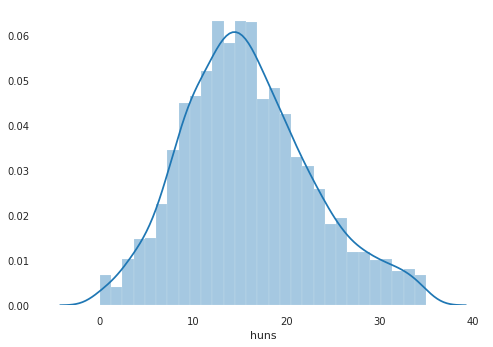

In [47]:
import seaborn as sns
sns.distplot(df['huns']);

In [48]:
df['huns'].describe().T

count    3201.000000
mean       15.894916
std         6.938438
min         0.000000
25%        11.000000
50%        15.250000
75%        20.125000
max        35.000000
Name: huns, dtype: float64

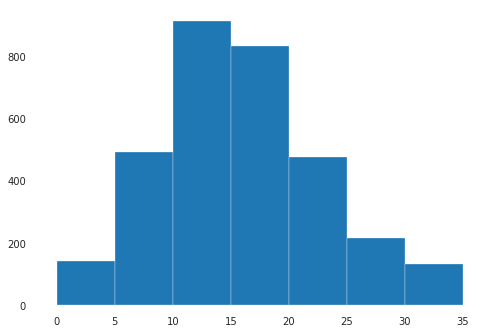

In [49]:
from matplotlib import pyplot as plt
plt.hist(df['huns'], bins=[0, 5, 10, 15, 20, 25, 30, 35]);

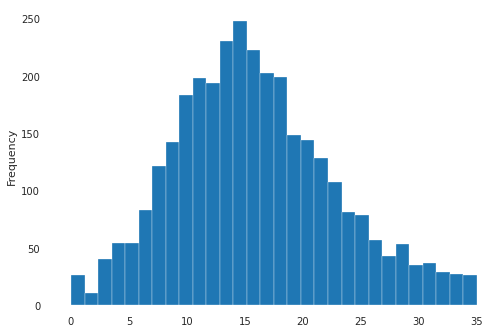

In [50]:
df['huns'].plot.hist(bins=30)

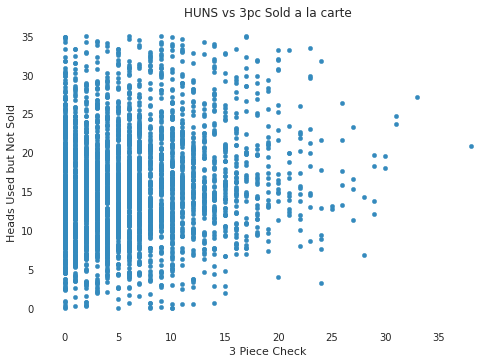

In [51]:
# Looking into the possibilities found above
# 3pc
(df
 .plot
 .scatter(x='3pc', y='huns')
 .set(title='HUNS vs 3pc Sold a la carte',
      xlabel='3 Piece Check',
      ylabel='Heads Used but Not Sold')
);

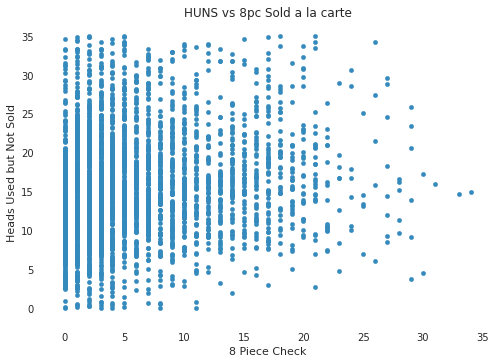

In [52]:
# 8pc
(df
 .plot
 .scatter(x='8pc', y='huns')
 .set(title='HUNS vs 8pc Sold a la carte',
      xlabel='8 Piece Check',
      ylabel='Heads Used but Not Sold')
);

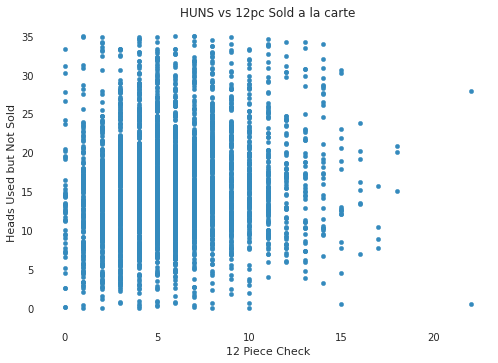

In [53]:
# 12pc
(df
 .plot
 .scatter(x='12pc', y='huns')
 .set(title='HUNS vs 12pc Sold a la carte',
      xlabel='12 Piece Check',
      ylabel='Heads Used but Not Sold')
);

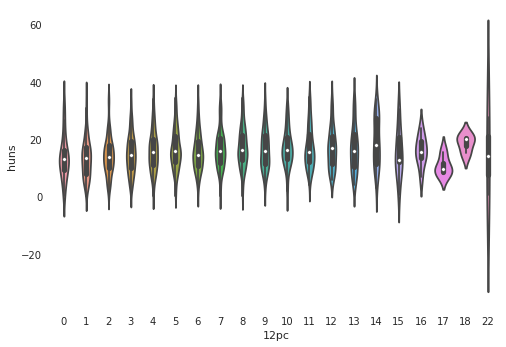

In [54]:
sns.violinplot(x='12pc', y='huns', data=df);

Text(0.5, 1.0, '20pc Meals')

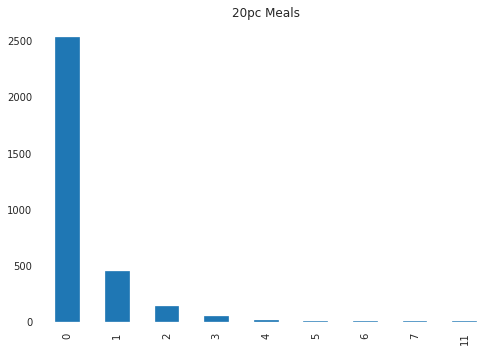

In [55]:
df['20pc_meal'].value_counts(sort=True).plot.bar().set_title('20pc Meals')

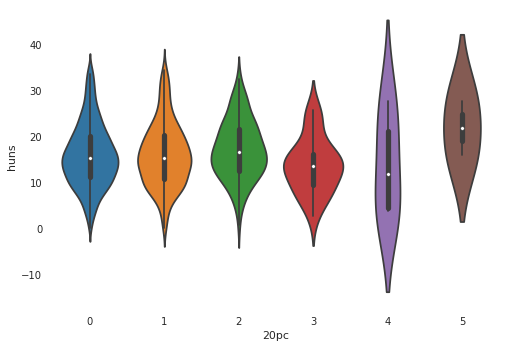

In [56]:
sns.violinplot(x='20pc', y='huns', data=df);

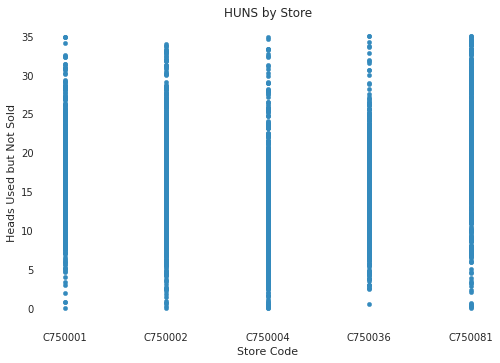

In [57]:
# HUNS by store
(df
 .plot
 .scatter(x='store_code', y='huns')
 .set(title='HUNS by Store',
      xlabel='Store Code',
      ylabel='Heads Used but Not Sold')
);

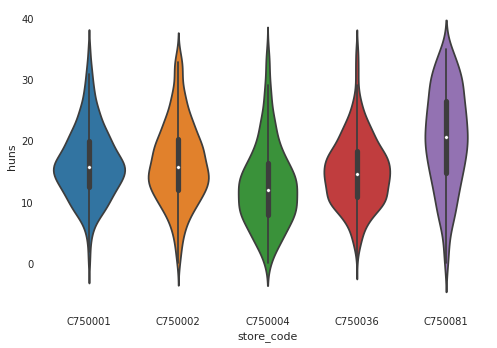

In [58]:
# HUNS by store more detail with a violin plot
sns.violinplot(x='store_code', y='huns', data=df);

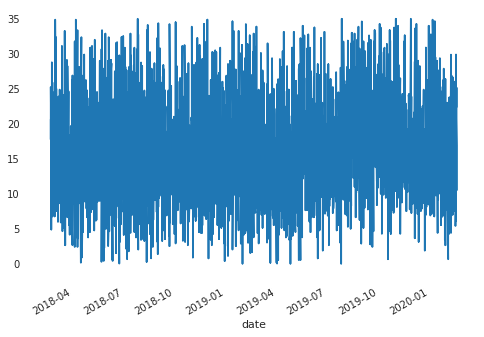

In [59]:
# ChickenHuns as time series
df.set_index('date')['huns'].plot();

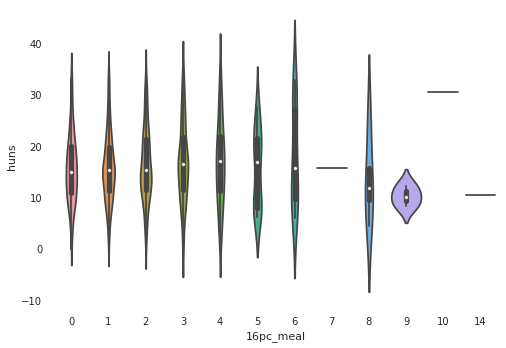

In [60]:
sns.violinplot(x='16pc_meal', y='huns', data=df);

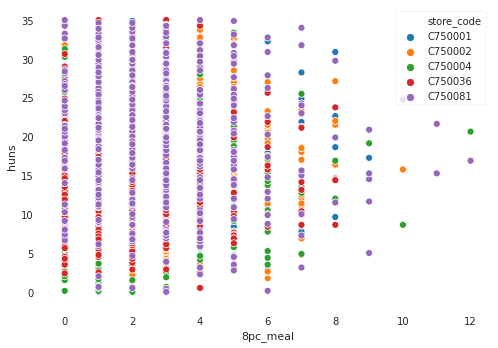

In [61]:
ax = sns.scatterplot(x='8pc_meal', y='huns', hue='store_code', data=df)

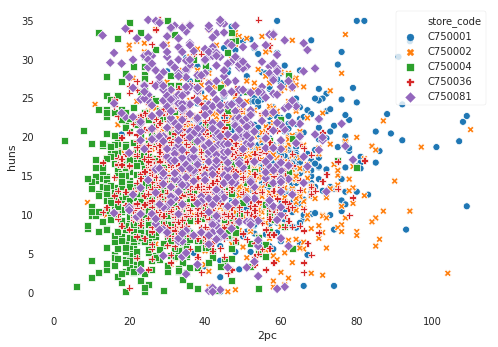

In [62]:
ax = sns.scatterplot(x='2pc', y='huns', hue='store_code', style='store_code', data=df)

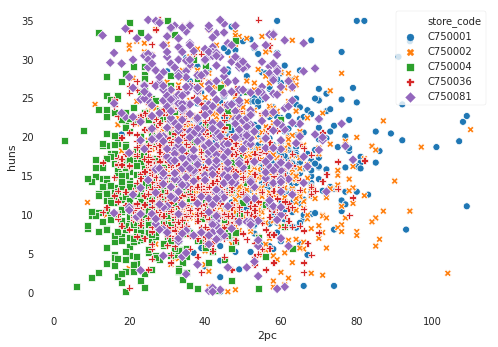

In [63]:
# HUNS by 2pc where 8pc is not zero
condition = (df['8pc'] != 0)
ax = sns.scatterplot(x='2pc',
                     y='huns',
                     hue='store_code',
                     style='store_code',
                     data=df[condition])

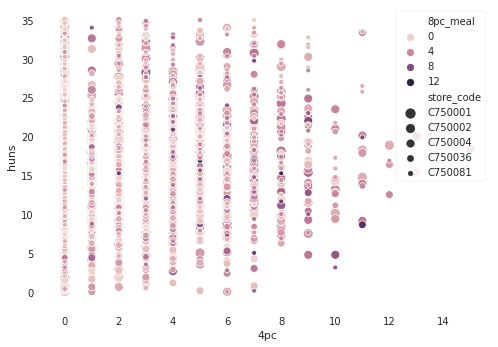

In [64]:
ax = sns.scatterplot(x='4pc',
                     y='huns',
                     hue='8pc_meal',
                     size='store_code',
                     data=df)

In [65]:
import plotly.express as px
px.scatter(df, x='date', y='huns', color='8pc_meal', opacity=0.5)

In [66]:
px.scatter(df, x='date', y='huns', color='2pc', opacity=0.5)

In [67]:
px.scatter(df, x='2pc', y='huns')

## Baseline: 15.89
Across all store and dates: 15.89

In [68]:
print(f'Average HUNS across all stores and all dates: {df.huns.mean():.2f}')

Average HUNS across all stores and all dates: 15.89


In [69]:
print('Average HUNS by store')
df.groupby('store_code')['huns'].mean()

Average HUNS by store


store_code
C750001    16.366058
C750002    16.296806
C750004    12.724407
C750036    14.969283
C750081    20.442010
Name: huns, dtype: float64

Average HUNS by store


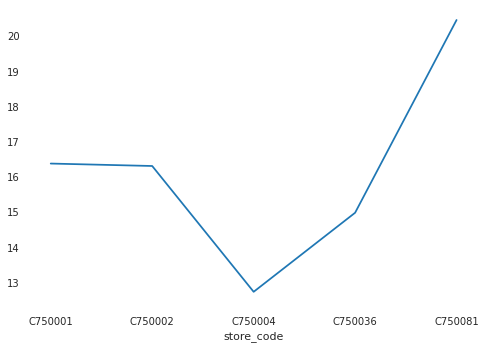

In [70]:
# Stores C750004 and C750081 seem to predict HUNS
print('Average HUNS by store')
df.groupby('store_code')['huns'].mean().plot()

In [71]:
df.groupby('store_code')['huns'].describe()

,count,mean,std,min,25%,50%,75%,max
store_code,,,,,,,,
C750001,657.0,16.366058,5.886425,0.0,12.500,15.750,19.87500,34.875
C750002,681.0,16.296806,6.609328,0.0,11.875,15.625,20.25000,34.000
C750004,674.0,12.724407,6.693881,0.0,7.875,12.000,16.37500,34.875
C750036,704.0,14.969283,5.677222,0.5,10.750,14.625,18.28125,35.000
C750081,485.0,20.442010,8.021537,0.0,14.750,20.625,26.50000,35.000


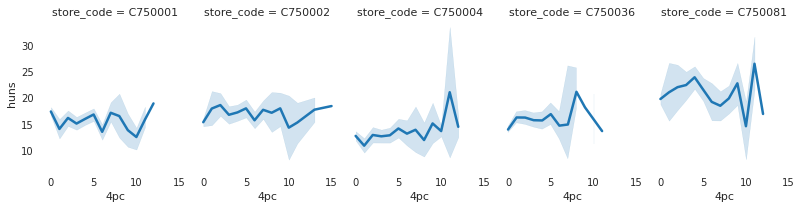

In [72]:
# Do the stores differ in HUNS by meals sold?
sns.relplot(x='4pc', y='huns', #hue="event", style="event",
            col='store_code', col_wrap=5,
            height=3, aspect=.75, linewidth=2.5,
            kind='line', data=df);

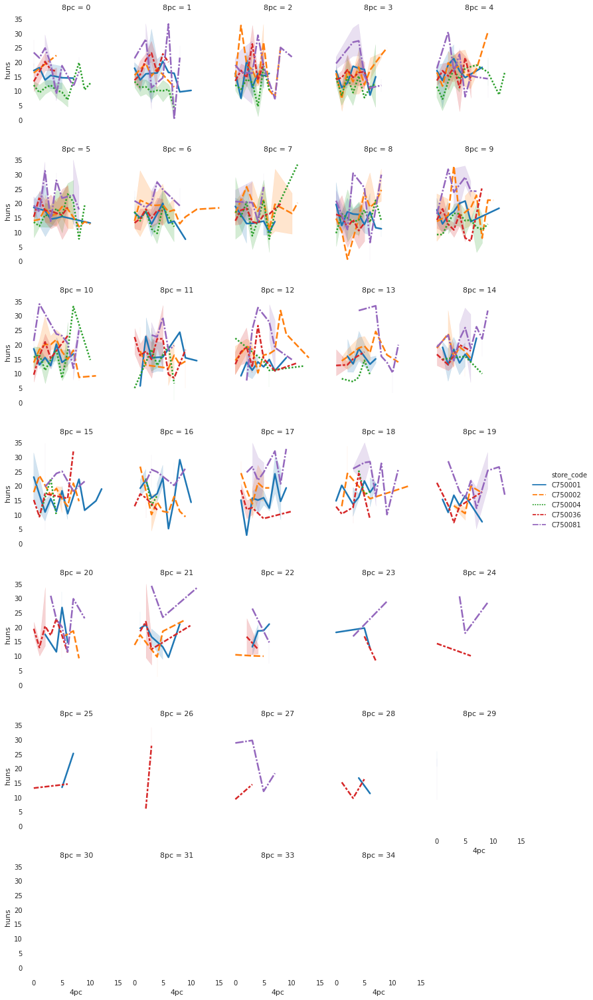

In [73]:
sns.relplot(x='4pc', y='huns', hue='store_code', style='store_code',
            col='8pc', col_wrap=5,
            height=3, aspect=.75, linewidth=2.5,
            kind='line', data=df);

# Feature Engineering
- Day of Week (categorical numeric)
- Total pieces sold
- All meals
- Time series shift
  - Yesterday's ChickenHuns
  - Yesterday's meals
- Store trend (last week, month, etc. representing crackdown by regional manager?)
- Modulus of total pieces divided by eight (a head of chicken is eight pieces)
- Ratio of 24pc to 8pc (staff anticipating 24pc but disappointed?)
- Rolling averages of 24pc (inversely related to HUNS?)

Engineered features that could be derived from this target:
- Today
- Tomorrow
- By restaurant
- Total across all restaurants

One could even engineer a new target, so that ChickenHuns could be categorical. Examples would be yes/no or none/little/much.

## Day of Week (dow)

In [74]:
# Add an integer column for day of week where Monday==0 and Sunday==6
df['dow'] = df['date'].dt.dayofweek
df.head()

,store_code,date_integer,huns,1pc,2pc,3pc,4pc,8pc,8pc_meal,12pc,12pc_meal,16pc,16pc_meal,20pc,20pc_meal,date,dow
0,C750001,20180221,20.625,23,61,10,0,29,1,7,1,4,0,1,1,2018-02-21,2
1,C750001,20180222,18.125,19,78,5,0,23,3,14,0,9,1,0,0,2018-02-22,3
2,C750001,20180223,14.875,16,68,8,0,34,1,10,2,7,1,1,0,2018-02-23,4
3,C750001,20180224,25.875,17,48,4,0,29,2,9,1,5,1,0,0,2018-02-24,5
4,C750001,20180225,24.500,21,43,6,0,27,3,14,1,5,1,0,0,2018-02-25,6


In [75]:
# We don't have more reports by day of week
df.dow.value_counts().sort_index()

0    456
1    451
2    466
3    456
4    453
5    455
6    464
Name: dow, dtype: int64

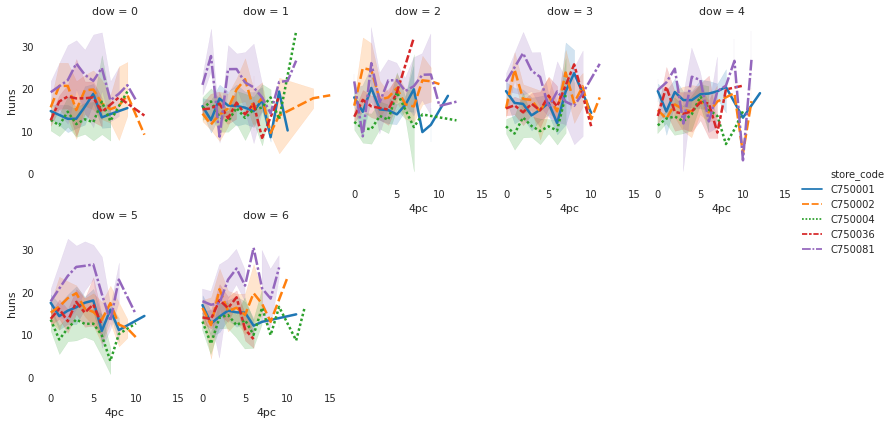

In [76]:
# But do we sell more chicken on weekends?
sns.relplot(x='4pc', y='huns', hue='store_code', style='store_code',
            col='dow', col_wrap=5,
            height=3, aspect=.75, linewidth=2.5,
            kind='line', data=df);

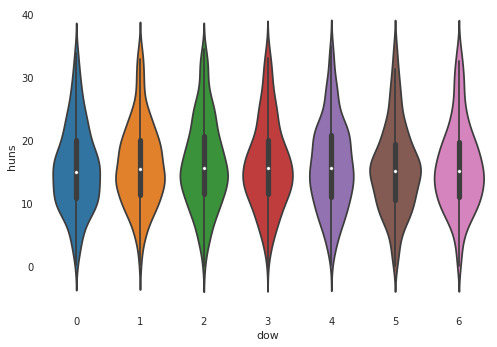

In [77]:
# HUNS by dow with a violin plot
sns.violinplot(x='dow', y='huns', data=df);

## Total pieces sold

In [78]:
# Total COB sold with meal or without
df['total_pc'] = (
    (df['1pc']) +
    (df['2pc']*2) +
    (df['3pc']*3) +
    (df['4pc']*4) +
    (df['8pc']*8) +
    (df['12pc']*12) +
    (df['16pc']*16) +
    (df['20pc']*20) +
    (df['8pc_meal']*8) +
    (df['12pc_meal']*12) +
    (df['16pc_meal']*16) +
    (df['20pc_meal']*20)
)

df.head()

,store_code,date_integer,huns,1pc,2pc,3pc,4pc,8pc,8pc_meal,12pc,12pc_meal,16pc,16pc_meal,20pc,20pc_meal,date,dow,total_pc
0,C750001,20180221,20.625,23,61,10,0,29,1,7,1,4,0,1,1,2018-02-21,2,615
1,C750001,20180222,18.125,19,78,5,0,23,3,14,0,9,1,0,0,2018-02-22,3,726
2,C750001,20180223,14.875,16,68,8,0,34,1,10,2,7,1,1,0,2018-02-23,4,748
3,C750001,20180224,25.875,17,48,4,0,29,2,9,1,5,1,0,0,2018-02-24,5,589
4,C750001,20180225,24.500,21,43,6,0,27,3,14,1,5,1,0,0,2018-02-25,6,641


In [79]:
df.describe()

,date_integer,huns,1pc,2pc,3pc,4pc,8pc,8pc_meal,12pc,12pc_meal,16pc,16pc_meal,20pc,20pc_meal,dow,total_pc
count,3.201000e+03,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000,3201.000000
mean,2.018715e+07,15.894916,13.185255,41.138082,6.344892,2.237738,6.233052,2.317088,5.865355,1.679163,3.430490,0.974695,0.268041,0.322712,3.005936,364.680412
std,5.994632e+03,6.938438,9.031181,15.557584,5.555044,2.627028,5.875483,1.733057,3.247353,1.475583,2.350584,1.208427,0.584706,0.785342,2.001787,130.404865
min,2.018022e+07,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,47.000000
25%,2.018082e+07,11.000000,7.000000,30.000000,2.000000,0.000000,2.000000,1.000000,3.000000,1.000000,2.000000,0.000000,0.000000,0.000000,1.000000,268.000000
50%,2.019022e+07,15.250000,13.000000,40.000000,5.000000,1.000000,4.000000,2.000000,5.000000,1.000000,3.000000,1.000000,0.000000,0.000000,3.000000,353.000000
75%,2.019083e+07,20.125000,19.000000,51.000000,9.000000,4.000000,9.000000,3.000000,8.000000,2.000000,5.000000,1.000000,0.000000,0.000000,5.000000,445.000000
max,2.020022e+07,35.000000,54.000000,110.000000,38.000000,15.000000,34.000000,12.000000,22.000000,9.000000,22.000000,14.000000,5.000000,11.000000,6.000000,1021.000000


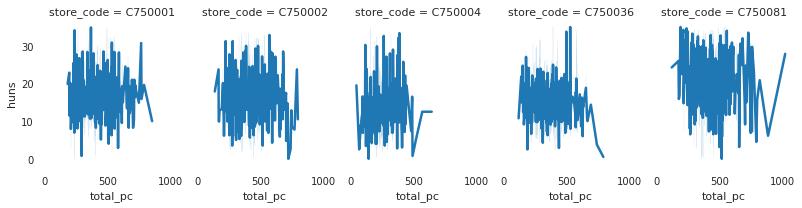

In [80]:
# HUNS by store and total pieces
sns.relplot(x='total_pc', y='huns',
            col='store_code', col_wrap=5,
            height=3, aspect=.75, linewidth=2.5,
            kind='line', data=df);

# Baseline MAE: 5.5451
Evaluation metric for this regression problem will be mean absolute error (MAE)

In [82]:
from sklearn.model_selection import train_test_split

# Split into train and test
train, test = train_test_split(df, train_size=0.80, test_size=0.20,
                               random_state=42)

# Split train into train and val
train, val = train_test_split(train, train_size=0.80, test_size=0.20, 
                              random_state=42)

print('Train, test, validation:', train.shape, test.shape, val.shape)

Train, test, validation: (2048, 18) (641, 18) (512, 18)


In [84]:
# Arrange data into X features matrix and y target vector
target = 'huns'
features_to_drop = [target, 'date']
features = df.columns.drop(features_to_drop)

X_train = train[features]
y_train = train[target]

X_val = val[features]
y_val = val[target]

X_test = test[features]
y_test = test[target]

print('X_train, y_train:', X_train.shape, y_train.shape)

X_train, y_train: (2048, 16) (2048,)


In [85]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

baseline_pred = [df.huns.mean()] * len(y_train)
baseline_mae = mean_absolute_error(y_train, baseline_pred)
print(f'Baseline Mean Absolute Error: {baseline_mae:.4f}')
# print(f'Baseline R^2 Score: {r2_score(y_train, baseline_pred):.8f}')

Baseline Mean Absolute Error: 5.5451


# Linear Model

In [ ]:
# time based split
# train = df[df['Date'].dt.year <= 2016]
# val = df[df['Date'].dt.year == 2017]
# test = df[df['Date'].dt.year >= 2018]
# df['created'] = pd.to_datetime(df['created'], infer_datetime_format=True)
# cutoff = pd.to_datetime('2016-06-01')
# train = df[df.created < cutoff]
# test  = df[df.created >= cutoff]
# train = homes[homes.Yr_Sold < 2009]
# val = homes[homes.Yr_Sold == 2009]
# test  = homes[homes.Yr_Sold == 2010]

In [86]:
import category_encoders as ce
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

lr_v1 = make_pipeline(
    ce.TargetEncoder(),  
    LinearRegression()
)

lr_v1.fit(X_train, y_train)
print('Linear Regression v1 R^2', lr_v1.score(X_val, y_val))

Linear Regression v1 R^2 0.11498410383533153


In [87]:
coefficients = lr_v1.named_steps['linearregression'].coef_
pd.Series(coefficients, features)

store_code      1.050946
date_integer    0.000043
1pc             0.049995
2pc            -0.001361
3pc             0.085594
4pc            -0.020109
8pc             0.092127
8pc_meal        0.003790
12pc           -0.001901
12pc_meal       0.017543
16pc           -0.022740
16pc_meal       0.159513
20pc           -0.269613
20pc_meal       0.100960
dow            -0.038422
total_pc       -0.006028
dtype: float64

In [88]:
lr_v2 = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True),
    LinearRegression()
)

lr_v2.fit(X_train, y_train)
print('Linear Regression v2 R^2', lr_v2.score(X_val, y_val))

Linear Regression v2 R^2 0.11826675621108816


In [90]:
# Model quality

y_pred_train = lr_v1.predict(X_train)
y_pred_test = lr_v1.predict(X_test)

print(f'Linear Regression with TargetEncoder MAE: {mean_absolute_error(y_train, y_pred_train):.4f}')
# print(f'Linear Regression Train R^2 Score: {r2_score(y_train, y_pred_train):.8f}')
print(f'Linear Regression with OneHotEncoder MAE: {mean_absolute_error(y_test, y_pred_test):.4f}')
# print(f'Linear Regression Test R^2 Score: {r2_score(y_test, y_pred_test):.8f}')

Linear Regression with TargetEncoder MAE: 5.1188
Linear Regression with OneHotEncoder MAE: 5.1782


# Gradient Boosting Model

In [91]:
from xgboost import XGBRegressor

gb = make_pipeline(
    ce.OrdinalEncoder(), 
    XGBRegressor(n_estimators=200, objective='reg:squarederror', n_jobs=-1)
)
gb.fit(X_train, y_train)
y_pred = gb.predict(X_val)
print('Gradient Boosting R^2', r2_score(y_val, y_pred))

Gradient Boosting R^2 0.1463067023075536


In [92]:
y_pred_val_gb = gb.predict(X_val)
y_pred_test_gb = gb.predict(X_test)
print(f'XGB Validation accuracy {gb.score(X_val, y_val)*100:.4f}%')
print(f'XGB Validation R^2 Score: {r2_score(y_val, y_pred_val_gb):.8f}')
print(f'XGB Test accuracy {gb.score(X_test, y_test)*100:.4f}%')
print(f'XGB Test R^2 score: {r2_score(y_test, y_pred_test_gb):.8f}')

XGB Validation accuracy 14.6307%
XGB Validation R^2 Score: 0.14630670
XGB Test accuracy 10.0322%
XGB Test R^2 score: 0.10032232


In [93]:
gb.named_steps['xgbregressor'].feature_importances_

array([0.26635942, 0.02479385, 0.05063793, 0.03885996, 0.07830032,
       0.05397709, 0.04998213, 0.05430435, 0.05370839, 0.02828495,
       0.05773827, 0.03535052, 0.04414006, 0.04341817, 0.06846334,
       0.05168129], dtype=float32)

# Visualizations to Explain the Model



## Partial Dependence Plot with One Feature

In [94]:
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 72

In [98]:
from pdpbox.pdp import pdp_isolate, pdp_plot

feature = '12pc'

isolated = pdp_isolate(
    model=gb,
    dataset=X_val,
    model_features=X_val.columns,
    feature=feature
)

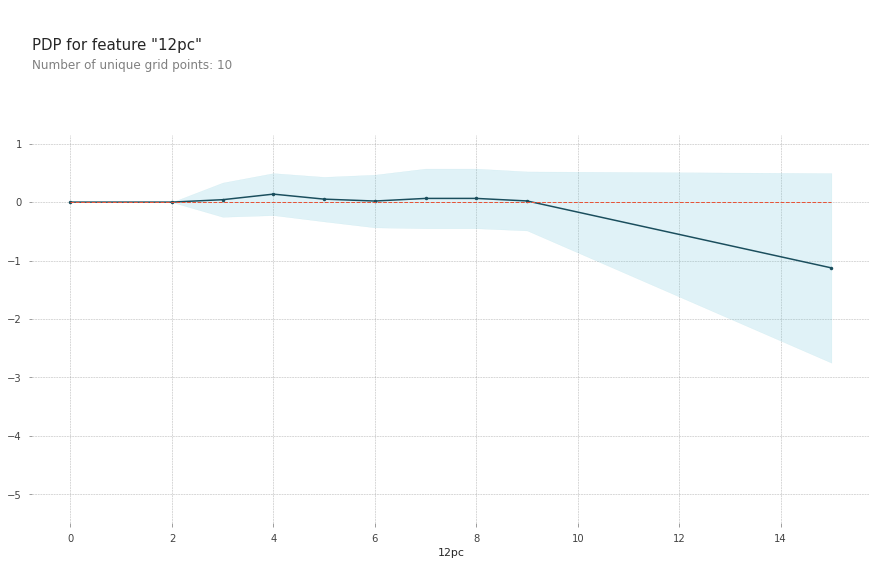

In [99]:
pdp_plot(isolated, feature_name=feature);

## Partial Dependence Plot With Two Features

In [100]:
from pdpbox.pdp import pdp_interact, pdp_interact_plot

features = ['2pc', 'total_pc']

interaction = pdp_interact(
    model=gb,
    dataset=X_val,
    model_features=X_val.columns,
    features=features
)

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


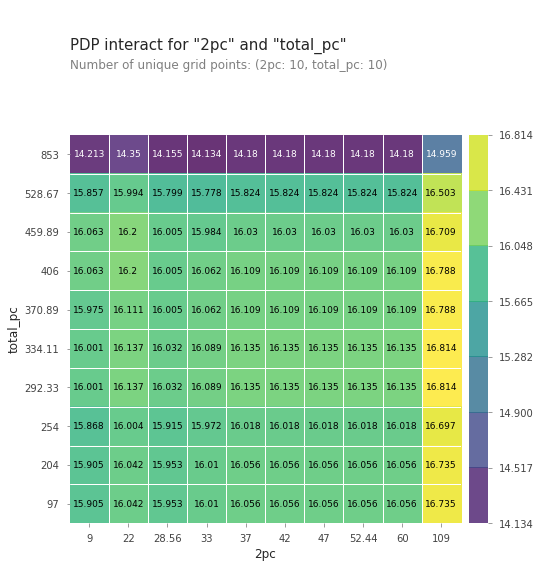

In [101]:
pdp_interact_plot(interaction, plot_type='grid', feature_names=features);

# Random Forest Model

In [102]:
X_train.head()

,store_code,date_integer,1pc,2pc,3pc,4pc,8pc,8pc_meal,12pc,12pc_meal,16pc,16pc_meal,20pc,20pc_meal,dow,total_pc
1476,C750004,20180428,4,32,0,0,3,3,3,2,3,0,0,0,5,224
989,C750002,20181223,20,52,0,0,7,5,5,2,2,0,0,1,6,356
621,C750001,20191217,19,44,7,8,19,1,4,2,3,5,0,0,1,520
857,C750002,20180812,0,55,3,0,2,6,7,4,10,5,1,0,6,575
753,C750002,20180430,32,61,1,0,0,2,1,2,4,2,0,0,0,305


In [103]:
X_test.head()

,store_code,date_integer,1pc,2pc,3pc,4pc,8pc,8pc_meal,12pc,12pc_meal,16pc,16pc_meal,20pc,20pc_meal,dow,total_pc
1452,C750004,20180404,0,36,0,0,2,2,3,2,3,0,0,0,2,212
1252,C750002,20190913,24,47,7,7,2,1,3,3,1,1,0,1,4,315
3170,C750081,20181230,12,59,0,0,3,3,7,2,4,0,0,1,6,370
1607,C750004,20180906,0,62,0,0,0,2,2,2,1,1,0,0,3,220
228,C750001,20181116,30,107,4,0,2,5,3,1,9,1,0,0,4,520


In [104]:
# Encode with one-hot encoding
encoder = ce.OneHotEncoder(use_cat_names=True)
X_train = encoder.fit_transform(X_train)
X_test = encoder.transform(X_test)
X_val = encoder.transform(X_val)

X_train.head()

,store_code_C750004,store_code_C750002,store_code_C750001,store_code_C750036,store_code_C750081,date_integer,1pc,2pc,3pc,4pc,8pc,8pc_meal,12pc,12pc_meal,16pc,16pc_meal,20pc,20pc_meal,dow,total_pc
1476,1,0,0,0,0,20180428,4,32,0,0,3,3,3,2,3,0,0,0,5,224
989,0,1,0,0,0,20181223,20,52,0,0,7,5,5,2,2,0,0,1,6,356
621,0,0,1,0,0,20191217,19,44,7,8,19,1,4,2,3,5,0,0,1,520
857,0,1,0,0,0,20180812,0,55,3,0,2,6,7,4,10,5,1,0,6,575
753,0,1,0,0,0,20180430,32,61,1,0,0,2,1,2,4,2,0,0,0,305


In [105]:
from scipy.stats import randint, uniform
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

param_distributions = { 
    'n_estimators': randint(50, 500), 
    'max_depth': [5, 10, 15, 20, None], 
    'max_features': uniform(0, 1), 
}

search = RandomizedSearchCV(
    RandomForestRegressor(random_state=42), 
    param_distributions=param_distributions, 
    n_iter=5, 
    cv=2, 
    scoring='neg_mean_absolute_error', 
    verbose=10, 
    return_train_score=True, 
    n_jobs=-1, 
    random_state=42
)

search.fit(X_train, y_train);

Fitting 2 folds for each of 5 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.8s finished


In [107]:
# print('Best hyperparameters', search.best_params_)
print('Random Forest cross-validation MAE', -search.best_score_)
model = search.best_estimator_

Random Forest cross-validation MAE 5.137387281272844


### Shapley Plot

In [108]:
# Get an individual observation to explain.
# For example, the 0th row from the test set.
row = X_test.iloc[[0]]
row

,store_code_C750004,store_code_C750002,store_code_C750001,store_code_C750036,store_code_C750081,date_integer,1pc,2pc,3pc,4pc,8pc,8pc_meal,12pc,12pc_meal,16pc,16pc_meal,20pc,20pc_meal,dow,total_pc
1452,1,0,0,0,0,20180404,0,36,0,0,2,2,3,2,3,0,0,0,2,212


In [109]:
# What was the actual HUNS for this store on Tuesday?
y_test.iloc[[0]]

1452    14.125
Name: huns, dtype: float64

In [110]:
# What does the model predict?
model.predict(row)

array([15.82675439])

In [111]:
# Why did the model predict this?
# Look at a Shapley Values Force Plot
import shap
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(row)
shap_values

array([[-1.39488002, -0.0029278 , -0.03836052,  0.02036713, -0.55751313,
         0.48514123,  0.25311873,  0.56343416, -0.18798762,  0.08557534,
        -0.06972082,  0.15444681, -0.01467842,  0.18060914,  0.21289547,
         0.09554122,  0.03740905, -0.01344908,  0.06090566,  0.07125306]])

In [112]:
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value,
    shap_values=shap_values,
    features=row
)

## Permutations

In [120]:
gb.named_steps

{'ordinalencoder': OrdinalEncoder(cols=['store_code'], drop_invariant=False,
                handle_missing='value', handle_unknown='value',
                mapping=[{'col': 'store_code', 'data_type': dtype('O'),
                          'mapping': C750004    1
 C750002    2
 C750001    3
 C750036    4
 C750081    5
 NaN       -2
 dtype: int64}],
                return_df=True, verbose=0),
 'xgbregressor': XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              importance_type='gain', learning_rate=0.1, max_delta_step=0,
              max_depth=3, min_child_weight=1, missing=None, n_estimators=200,
              n_jobs=-1, nthread=None, objective='reg:squarederror',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=1, verbosity=1)}

In [125]:
# Ignore warnings
# doesn't work with pipelines, so separate encoder and imputer

# Data transformation

transformers = make_pipeline(
    ce.ordinal.OrdinalEncoder()
)

X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)

# Model fitting
# Now create random forest model separately

model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
model.fit(X_train_transformed, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

In [126]:
import eli5
from eli5.sklearn import PermutationImportance

permuter = PermutationImportance(
    model,
#    scoring='accuracy',
#    n_iter=5,
#    random_state=42
)

permuter.fit(X_val_transformed, y_val)

Using TensorFlow backend.


PermutationImportance(cv='prefit',
                      estimator=RandomForestRegressor(bootstrap=True,
                                                      ccp_alpha=0.0,
                                                      criterion='mse',
                                                      max_depth=None,
                                                      max_features='auto',
                                                      max_leaf_nodes=None,
                                                      max_samples=None,
                                                      min_impurity_decrease=0.0,
                                                      min_impurity_split=None,
                                                      min_samples_leaf=1,
                                                      min_samples_split=2,
                                                      min_weight_fraction_leaf=0.0,
                                                      n_estimators=100

### Feature importances before engineering dow and total_pc

Weight	Feature

0.2094 ± 0.0952	store_code

0.0054 ± 0.0262	2pc

0.0024 ± 0.0059	8pc_meal

0.0012 ± 0.0070	20pc

0.0007 ± 0.0299	8pc

-0.0019 ± 0.0094	12pc_meal

-0.0031 ± 0.0065	20pc_meal

-0.0041 ± 0.0146	16pc_meal

-0.0041 ± 0.0282	3pc

-0.0058 ± 0.0093	4pc

-0.0094 ± 0.0320	12pc

-0.0095 ± 0.0299	16pc

-0.0167 ± 0.0061	1pc

### After
Weight	Feature

0.2367 ± 0.0579	store_code

0.0085 ± 0.0103	total_pc

0.0040 ± 0.0106	8pc

-0.0004 ± 0.0078	20pc_meal

-0.0007 ± 0.0046	20pc

-0.0009 ± 0.0176	1pc

-0.0034 ± 0.0054	8pc_meal

-0.0034 ± 0.0046	4pc

-0.0077 ± 0.0053	16pc_meal

-0.0101 ± 0.0090	16pc

-0.0105 ± 0.0098	12pc_meal

-0.0112 ± 0.0360	2pc

-0.0115 ± 0.0183	dow

-0.0159 ± 0.0222	12pc

-0.0202 ± 0.0177	3pc

In [127]:
feature_names = X_val.columns.to_list()

pd.Series(permuter.feature_importances_, feature_names).sort_values(ascending=True)

12pc                 -0.011259
3pc                  -0.008190
2pc                  -0.005138
8pc                  -0.003532
20pc_meal            -0.001430
20pc                 -0.000025
8pc_meal              0.000210
16pc                  0.000898
12pc_meal             0.001388
total_pc              0.002138
4pc                   0.002523
16pc_meal             0.002758
1pc                   0.002878
store_code_C750002    0.003234
store_code_C750036    0.003507
dow                   0.007326
store_code_C750001    0.012758
date_integer          0.088045
store_code_C750004    0.098891
store_code_C750081    0.159788
dtype: float64

In [128]:
eli5.show_weights(permuter,
                  top=None,
                  feature_names=feature_names)

Weight,Feature
0.1598 ± 0.0548,store_code_C750081
0.0989 ± 0.0353,store_code_C750004
0.0880 ± 0.0376,date_integer
0.0128 ± 0.0055,store_code_C750001
0.0073 ± 0.0183,dow
0.0035 ± 0.0043,store_code_C750036
0.0032 ± 0.0023,store_code_C750002
0.0029 ± 0.0257,1pc
0.0028 ± 0.0067,16pc_meal
0.0025 ± 0.0066,4pc
